# Import modules and data

In [76]:
# Import necessary modules for analysis

# Import pandas for dataframe functionality
import pandas as pd

# Import numpy to use arrays
import numpy as np

# Import pyplot for creation of figures
import matplotlib.pyplot as plt

# Import curve_fit to fit custom curves
from scipy.optimize import curve_fit


# Import the PCA function from scikitlearn
from sklearn.decomposition import PCA

# Import interp1d to interpolate points
from scipy.interpolate import interp1d

# Import seaaborn for additional visualization beyond matplotlib of dataframes
import seaborn as sns

# Import for color map generation
from itertools import cycle, islice

# Import math for math funnctions
import math

In [77]:
# Read in all data
df = pd.read_csv("./morphospace.csv")

# Subset just the USDA Geneva, NY data with developmental data for first analyses
# Subset passiflora data
ny_data = df[ df["dataset"]=="NY_germplasm"]
passiflora_data = df[ df["dataset"]=="passiflora"]

# COORDINATES A through I on a mean leaf

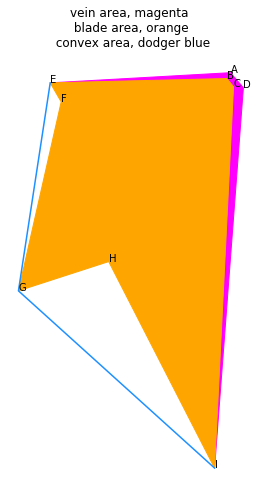

In [119]:
vein_xvals = [df["xA"].mean(),
              df["xE"].mean(),
              df["xB"].mean(),
              df["xC"].mean(),
              df["xI"].mean(),
              df["xD"].mean()]

vein_yvals = [df["yA"].mean(),
              df["yE"].mean(),
              df["yB"].mean(),
              df["yC"].mean(),
              df["yI"].mean(),
              df["yD"].mean()]

blade_xvals = [df["xB"].mean(),
              df["xE"].mean(),
              df["xF"].mean(),
              df["xG"].mean(),
              df["xH"].mean(),
              df["xI"].mean(),
              df["xC"].mean()]

blade_yvals = [df["yB"].mean(),
              df["yE"].mean(),
              df["yF"].mean(),
              df["yG"].mean(),
              df["yH"].mean(),
              df["yI"].mean(),
              df["yC"].mean()]

convex_xvals = [df["xE"].mean(),
              df["xG"].mean(),
              df["xI"].mean()]

convex_yvals = [df["yE"].mean(),
              df["yG"].mean(),
              df["yI"].mean()]

fig = plt.figure(figsize=(8,8))

plt.fill(vein_xvals, vein_yvals, c="magenta")
plt.fill(blade_xvals, blade_yvals, c="orange")
plt.plot(convex_xvals, convex_yvals, c="dodgerblue")

plt.text(df["xA"].mean(),df["yA"].mean(),"A")
plt.text(df["xB"].mean(),df["yB"].mean(),"B")
plt.text(df["xC"].mean(),df["yC"].mean(),"C")
plt.text(df["xD"].mean(),df["yD"].mean(),"D")
plt.text(df["xE"].mean(),df["yE"].mean(),"E")
plt.text(df["xF"].mean(),df["yF"].mean(),"F")
plt.text(df["xG"].mean(),df["yG"].mean(),"G")
plt.text(df["xH"].mean(),df["yH"].mean(),"H")
plt.text(df["xI"].mean(),df["yI"].mean(),"I")



plt.title("vein area, magenta \n blade area, orange \n convex area, dodger blue")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig("./coordinates.jpg")

# MODELING VEIN-TO-BLADE RATIO AND NORMALIZED NODE POSITION

## For grapevine

In [84]:
#####
# Fit a polynomial of ln(vein-to-blade ratio) modeled as a function of normalized node position
#####

vtb_coefficients = np.polyfit(ny_data['norm_node_base'],ny_data['vein_to_blade_convex'],2)
vtb_func = np.poly1d(vtb_coefficients)
x_axis = np.linspace(min(ny_data['norm_node_base']),max(ny_data['norm_node_base']),100)
vtb_y_axis = vtb_func(x_axis)

#####
# Create a function to solve for y given x
#####

def solve_for_y(poly_coeffs, y):
    pc = poly_coeffs.copy()
    pc[-1] -= y
    return np.roots(pc)

#####
# Given the minimum of the ln(vein-to-blade ratio) and maximum of ln(area) function, 
# solve for x value of normalized node position
#####

vtb_roots = solve_for_y(vtb_coefficients, min(vtb_y_axis))

#####
# Take the average x value at the y minimum or maximum
#####

vtb_node_cutoff = np.mean(vtb_roots)

#####
# Print out the minimum ln(vein-to-blade ratio) normalized node value and
# Print out the maximum ln(area) normalized node value
#####

print("the minimum vein-to-blade ratio value is at normalized node position", vtb_node_cutoff)


the minimum vein-to-blade ratio value is at normalized node position 0.4620881037778243


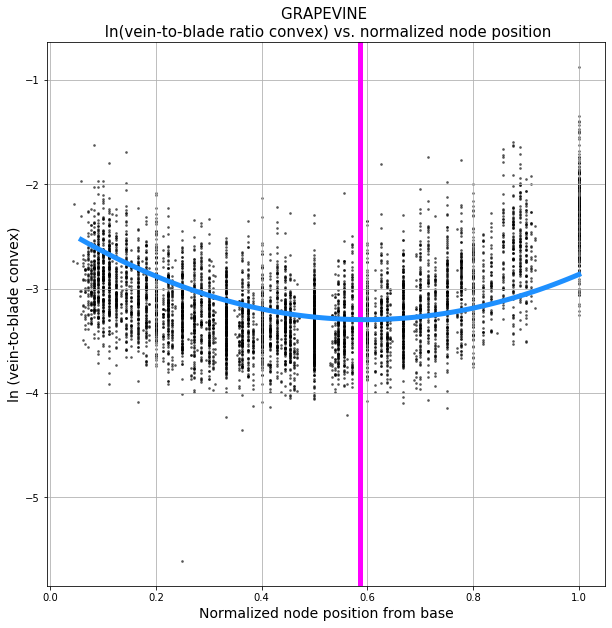

In [123]:
#####
# Visualize vein-to-blade ratio and ln(area) as a function of normalized node value
#####

# set figure size
plt.figure(figsize=(10,10))

################################################################
# Figure 2A: ln(vein to blade ratio) vs normalized node position
################################################################


# show where in shoot we subset, using the ln(vein to blade) minimum normalized node position in magenta
plt.axvline(x=vtb_node_cutoff, linewidth=5, alpha=1, color="magenta") 
# plot data, ln(vein to blade) vs normalized node position
plt.scatter(ny_data['norm_node_base'],ny_data['vein_to_blade_convex'], color="k", s=3, alpha=0.5)
# plot modeled polynomial function
plt.plot(x_axis, vtb_y_axis, color="dodgerblue", linewidth=5)
plt.xlabel('Normalized node position from base', fontsize = 14)
plt.ylabel('ln (vein-to-blade convex)', fontsize = 14)
plt.title('GRAPEVINE \n ln(vein-to-blade ratio convex) vs. normalized node position', fontsize = 15)
plt.grid()

plt.savefig("./grapevine_convex_vtb.jpg")



## For passiflora
### (note that code is exactly the same as above and that variables are not renamed)

In [86]:
#####
# Fit a polynomial of ln(vein-to-blade ratio) modeled as a function of normalized node position
#####

vtb_coefficients = np.polyfit(passiflora_data['norm_node_base'],passiflora_data['vein_to_blade_convex'],2)
vtb_func = np.poly1d(vtb_coefficients)
x_axis = np.linspace(min(passiflora_data['norm_node_base']),max(passiflora_data['norm_node_base']),100)
vtb_y_axis = vtb_func(x_axis)

#####
# Create a function to solve for y given x
#####

def solve_for_y(poly_coeffs, y):
    pc = poly_coeffs.copy()
    pc[-1] -= y
    return np.roots(pc)

#####
# Given the minimum of the ln(vein-to-blade ratio) and maximum of ln(area) function, 
# solve for x value of normalized node position
#####

vtb_roots = solve_for_y(vtb_coefficients, min(vtb_y_axis))

#####
# Take the average x value at the y minimum or maximum
#####

vtb_node_cutoff = np.mean(vtb_roots)

#####
# Print out the minimum ln(vein-to-blade ratio) normalized node value and
# Print out the maximum ln(area) normalized node value
#####

print("the minimum vein-to-blade ratio value is at normalized node position", vtb_node_cutoff)

the minimum vein-to-blade ratio value is at normalized node position 0.5863358151344205


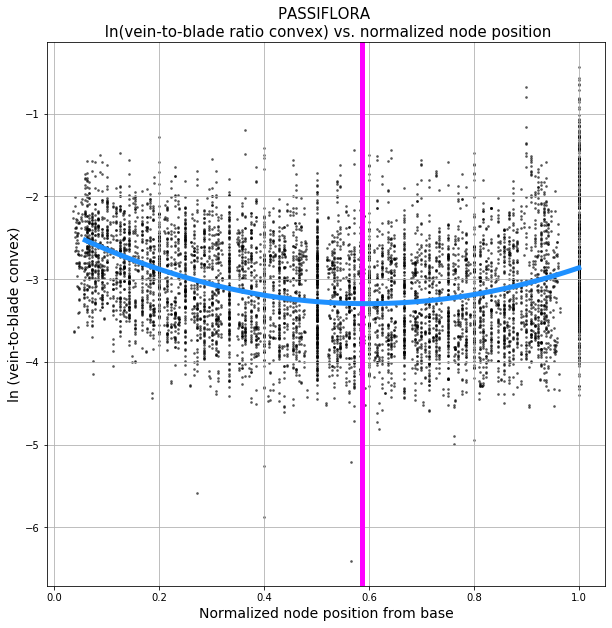

In [124]:
#####
# Visualize vein-to-blade ratio and ln(area) as a function of normalized node value
#####

# set figure size
plt.figure(figsize=(10,10))

################################################################
# Figure 2A: ln(vein to blade ratio) vs normalized node position
################################################################


# show where in shoot we subset, using the ln(vein to blade) minimum normalized node position in magenta
plt.axvline(x=vtb_node_cutoff, linewidth=5, alpha=1, color="magenta") 
# plot data, ln(vein to blade) vs normalized node position
plt.scatter(passiflora_data['norm_node_base'],passiflora_data['vein_to_blade_convex'], color="k", s=3, alpha=0.5)
# plot modeled polynomial function
plt.plot(x_axis, vtb_y_axis, color="dodgerblue", linewidth=5)
plt.xlabel('Normalized node position from base', fontsize = 14)
plt.ylabel('ln (vein-to-blade convex)', fontsize = 14)
plt.title('PASSIFLORA \n ln(vein-to-blade ratio convex) vs. normalized node position', fontsize = 15)
plt.grid()

plt.savefig("./passiflora_convex_vtb.jpg")


# PRINCIPAL COMPONENT ANALYSIS, INVERSE TRANSFORM, PROJECTION OF DATA

In [88]:
###########################################################
##### CREATE MODELS OF EACH SPECIES TO PROJECT ONTO THE PCA
###########################################################

# PICK SPECIES TO MODEL
# the most represented, except for Ampelopsis, for representation

species_list = ["Ampelopsis_brevipedunculata",
                "Vitis_acerifolia",
                "Vitis_vulpina",
                "Vitis_labrusca",
                "Vitis_riparia",
                "Vitis_cinerea",
                "Vitis_rupestris",
                
                "suberosa",
                "tricuspis",
                "misera",
                "miersii",
                "coriacea",
                "racemosa",
                "sidifolia",
                "foetida",
                "galbana"
               ]

# for coloring models projected onto PCA by grapevine or passiflora later
species_colors = ["g","g","g","g","g","g","g",
                 "p","p","p","p","p","p","p","p","p"
                 ]

order = 2 # order of polynomial
n = 100 # number of time points

##### LISTS TO SAVE SHAPES #####

xAval = [] # modeled values for each coord
yAval = [] 
xBval = [] 
yBval = [] 
xCval = [] 
yCval = [] 
xDval = [] 
yDval = [] 
xEval = [] 
yEval = [] 
xFval = [] 
yFval = [] 
xGval = [] 
yGval = [] 
xHval = [] 
yHval = [] 
xIval = [] 
yIval = [] 


for spe in species_list:

    ##### SELECT SPECIES #####
    species = spe
    species_df = df[ df["species_pop"]==species ]

    xmin = min(species_df['norm_node_base']) # minimum vein to blade ratio value 
    xmax = max(species_df['norm_node_base']) # maximum vein to blade ratio value
    x_axis = np.linspace(xmin,xmax,n) # x values used to mode

    #####
    # CREATE MODELS
    #####

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xA'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xAval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xB'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xBval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xC'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xCval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xD'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xDval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xE'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xEval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xF'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xFval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xG'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xGval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xH'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xHval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['xI'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    xIval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yA'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yAval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yB'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yBval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yC'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yCval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yD'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yDval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yE'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yEval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yF'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yFval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yG'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yGval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yH'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yHval.append(y_axis) # append modeled coord values

    coefficients = np.polyfit(species_df['norm_node_base'],species_df['yI'],order) # create coefficients for current coordinate
    func = np.poly1d(coefficients) # create function of current coord vs vein-to-blade values
    y_axis = func(x_axis) # calculate modeled coord values
    yIval.append(y_axis) # append modeled coord values


##############################################
##### CREATE PANDAS DATAFRAME OF MODEL RESULTS
##############################################

df_list = []

for i in range(len(species_list)):
    
    model_dict = {"species":species_list[i],
                  "type":species_colors[i],
                  "xA":xAval[i],"yA":yAval[i],
                  "xB":xBval[i],"yB":yBval[i],
                  "xC":xCval[i],"yC":yCval[i],
                  "xD":xDval[i],"yD":yDval[i],
                  "xE":xEval[i],"yE":yEval[i],
                  "xF":xFval[i],"yF":yFval[i],
                  "xG":xGval[i],"yG":yGval[i],
                  "xH":xHval[i],"yH":yHval[i],
                  "xI":xIval[i],"yI":yIval[i]
                 }
               
    modeled_species_df = pd.DataFrame(model_dict)
               
    df_list.append(modeled_species_df )

models_species_df = pd.concat(df_list)

models_species_df
    

,species,type,xA,yA,xB,yB,xC,yC,xD,yD,xE,yE,xF,yF,xG,yG,xH,yH,xI,yI
0,Ampelopsis_brevipedunculata,g,408.898085,447.113473,371.607209,398.980864,429.384426,363.794203,510.050441,350.346226,-807.745991,508.893504,-402.496522,277.876577,-905.865461,-799.747285,128.675834,-115.170474,267.491978,-1432.087087
1,Ampelopsis_brevipedunculata,g,408.415760,445.886494,371.385229,398.813948,428.735092,364.054952,508.161638,350.804786,-804.412898,509.523632,-405.454812,280.585405,-904.842935,-797.762633,128.241579,-114.798347,269.771347,-1437.108236
2,Ampelopsis_brevipedunculata,g,407.922620,444.714686,371.146458,398.676302,428.073951,364.336373,506.283462,351.281473,-801.090924,510.073931,-408.310448,283.212787,-903.789613,-795.781111,127.799655,-114.402884,271.964838,-1442.111558
3,Ampelopsis_brevipedunculata,g,407.418665,443.598049,370.890895,398.567928,427.401003,364.638467,504.415915,351.776289,-797.780068,510.544402,-411.063427,285.758722,-902.705495,-793.802717,127.350063,-113.984087,274.072449,-1447.097054
4,Ampelopsis_brevipedunculata,g,406.903896,442.536583,370.618542,398.488825,426.716247,364.961235,502.558996,352.289232,-794.480330,510.935045,-413.713751,288.223212,-901.590582,-791.827453,126.892801,-113.541955,276.094182,-1452.064724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,galbana,p,171.418044,597.858601,171.288628,575.651227,152.088882,350.635133,200.117298,348.826349,-206.084434,235.379996,-221.751307,143.864549,-217.386208,-136.508550,-215.516753,-243.000024,165.825851,-1872.707281
96,galbana,p,171.691139,601.024209,171.535233,578.243665,151.518763,347.722042,200.441042,345.763903,-205.705279,233.687539,-221.261836,141.285391,-216.845898,-136.257960,-215.033019,-243.637439,163.659856,-1867.831351
97,galbana,p,172.017140,604.304069,171.833019,580.931250,150.974658,344.745297,200.816060,342.632796,-205.352891,231.970725,-220.804945,138.644672,-216.341566,-136.066135,-214.580661,-244.373218,161.439186,-1862.789456
98,galbana,p,172.396049,607.698182,172.181986,583.713982,150.456566,341.704897,201.242353,339.433026,-205.027271,230.229554,-220.380633,135.942392,-215.873213,-135.933075,-214.159678,-245.207362,159.163841,-1857.581597


In [89]:
########################################################################
### PERFORM PCA FIRST WITH ALL PCs TO SEE HOW MUCH VARIANCE IS EXPLAINED
########################################################################

# take all climate and lobing dataset leaves, only the landmarks
just_landmarks_data =df[['xA', 'yA', 'xB', 'yB', 'xC', 'yC', 'xD', 'yD',
       'xE', 'yE', 'xF', 'yF', 'xG', 'yG', 'xH', 'yH', 'xI', 'yI']]

# (this is modeled species data for later)
just_landmarks_spe_data = models_species_df[['xA', 'yA', 'xB', 'yB', 'xC', 'yC', 'xD', 'yD',
       'xE', 'yE', 'xF', 'yF', 'xG', 'yG', 'xH', 'yH', 'xI', 'yI']]

# convert to numpy array for PCA
raw_data = pd.DataFrame(just_landmarks_data).to_numpy() 

# (this is modeled species data for later)
spe_raw_data = pd.DataFrame(just_landmarks_spe_data).to_numpy() 

# perform the PCA with all possible PCs (x42)
test_pca = PCA(n_components=18)
test_PCs = test_pca.fit_transform(raw_data)

print(test_pca.explained_variance_ratio_) # print variance explained for each PC
print(test_pca.explained_variance_ratio_.cumsum()) # print cumulative variance for each PC

[3.22757908e-01 2.45513120e-01 1.65569416e-01 1.05073264e-01
 8.09585907e-02 3.72325906e-02 1.56051892e-02 1.10307819e-02
 7.93057173e-03 3.34477399e-03 2.64360979e-03 1.63287312e-03
 3.96316429e-04 2.25519047e-04 8.54572852e-05 1.77180648e-08
 1.68094840e-20 3.39316862e-21]
[0.32275791 0.56827103 0.73384044 0.83891371 0.9198723  0.95710489
 0.97271008 0.98374086 0.99167143 0.99501621 0.99765982 0.99929269
 0.99968901 0.99991452 0.99999998 1.         1.         1.        ]


In [104]:
###################################################################
### PERFORM PCA WITH JUST THE FIRST TWO PCs TO SEE WHAT'S HAPPENING
###################################################################

# Define the PCA function below, using two components (PC1 and PC2)
pca = PCA(n_components=2)

# Now apply the sklearn pca function with two components to the dataset
data_PCs = pca.fit_transform(raw_data)

# Now PROJECT the modeled species data onto the same PCA (modeled data not included in calculation of PCA)
spe_model_PCs = pca.transform(spe_raw_data)

# The inverse transform function is applied
inverse_PCA = pca.inverse_transform(data_PCs)

# Add PCs to the existing dataframe info and call "data_PCs_info"
data_PCs = pd.DataFrame(data_PCs)
data_PCs.columns = ['PC1','PC2']
data_PCs_info = pd.concat([df.reset_index(drop=True), data_PCs.reset_index(drop=True)], axis=1)

# Add projected species model PCs to the existing info and call "spe_model_PCs"
spe_model_PCs = pd.DataFrame(spe_model_PCs)
spe_model_PCs.columns = ['PC1','PC2']
spe_model_PCs = pd.concat([models_species_df[["species", "type"]].reset_index(drop=True), spe_model_PCs.reset_index(drop=True)], axis=1)


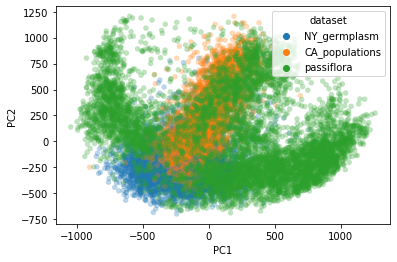

In [105]:
# Plot out PC1 and PC2 just to see the structure before proceeding

sns.scatterplot(data=data_PCs_info, x='PC1',y='PC2', hue="dataset", s=30, linewidth=0, alpha=0.3)

In [97]:
#######################################################
### PERFORM INVERSE PCA TO CALCULATE THEORETICAL LEAVES
### AND THEIR VEIN-TO-BLADE CONVEX RATIO AND DISTAL LOBING
#######################################################

# store PC coordinates and theoretical vein-to-blade CONVEX and distal lobing values

x_vals = []
y_vals = []
solidity_vals = []
vein_to_blade_vals = []
solidity_contour = []
vein_to_blade_contour = []

# create grid system across PC1 (x_vals) and PC2 (y_vals) to loop over

just_xvals = np.linspace(data_PCs_info["PC1"].min(), data_PCs_info["PC1"].max(), 50)
just_yvals = np.linspace(data_PCs_info["PC2"].min(), data_PCs_info["PC2"].max(), 50)

# loop over grid of PCA values and calculate theoretical leaves using inverse PCA
# from inverse calculated leaves, calculate vein-to-blade ratio and distal lobing

for i in just_xvals:
    
    print(i)
    
    solidity_convals = [] # for a list of lists
    vein_to_blade_convals = []
    
    for j in just_yvals:
        
        inverse_PCA = pca.inverse_transform(np.array([i,j]))
        
        inverse_df = pd.DataFrame(inverse_PCA)
        trans_df = inverse_df.T
        trans_df.columns=['xA', 'yA', 'xB', 'yB', 'xC', 'yC', 'xD', 'yD',
               'xE', 'yE', 'xF', 'yF', 'xG', 'yG', 'xH', 'yH', 'xI', 'yI']
        
        # Calculate the overall CONVEX area of a leaf using the shoestring algorithm

        # Note: These are Procrustes coordinates, so not absolute area,
        # but ultimately we are calculating a ratio of vein-to-blade CONVEX area

        # calculate the CONVEX area of a leaf

        trans_df['convex_area'] = (0.5)*abs(

        (trans_df['xA']*trans_df['yE'] + trans_df['xE']*trans_df['yG'] + trans_df['xG']*trans_df['yI'] + trans_df['xI']*trans_df['yD'] + trans_df['xD']*trans_df['yA']) - 

        (trans_df['yA']*trans_df['xE'] + trans_df['yE']*trans_df['xG'] + trans_df['yG']*trans_df['xI'] + trans_df['yI']*trans_df['xD'] + trans_df['yD']*trans_df['xA']) 

        )
        
        # calculate the area of a leaf

        trans_df['area'] = (0.5)*abs(

        (trans_df['xA']*trans_df['yE'] + trans_df['xE']*trans_df['yF'] + trans_df['xF']*trans_df['yG'] + trans_df['xG']*trans_df['yH'] + trans_df['xH']*trans_df['yI'] + trans_df['xI']*trans_df['yD']+ trans_df['xD']*trans_df['yA']) - 

        (trans_df['yA']*trans_df['xE'] + trans_df['yE']*trans_df['xF'] + trans_df['yF']*trans_df['xG'] + trans_df['yG']*trans_df['xH'] + trans_df['yH']*trans_df['xI'] + trans_df['yI']*trans_df['xD']+ trans_df['yD']*trans_df['xA']) 

        )

        # Next, calculate the area of the vasculature 

        trans_df['vasculature'] = (0.5)*abs(

        (trans_df['xA']*trans_df['yE'] + trans_df['xE']*trans_df['yB'] + trans_df['xB']*trans_df['yC'] + trans_df['xC']*trans_df['yI'] + trans_df['xI']*trans_df['yD'] + trans_df['xD']*trans_df['yA']) -

        (trans_df['yA']*trans_df['xE'] + trans_df['yE']*trans_df['xB'] + trans_df['yB']*trans_df['xC'] + trans_df['yC']*trans_df['xI'] + trans_df['yI']*trans_df['xD'] + trans_df['yD']*trans_df['xA'])

        )

        # Calculate CONVEX vein-to-blade ratio and solidity
        # We use natural log transformation which makes the distribution more normal

        trans_df["convex_vtb"] = np.log( trans_df['vasculature'] / (trans_df['convex_area']-trans_df['vasculature']) )
        trans_df["solidity"] = trans_df['area'] / trans_df['convex_area']
        
        x_vals.append(i) # append PC1 vals
        y_vals.append(j) # append PC2 vals
        solidity_vals.append(trans_df["solidity"][0]) # append values to a flat list
        vein_to_blade_vals.append(trans_df["convex_vtb"][0]   )
        solidity_convals.append(trans_df["solidity"][0]) # append values to make a list of lists
        vein_to_blade_convals.append(trans_df["convex_vtb"][0]   )
        
    solidity_contour.append(solidity_convals) # append list to list
    vein_to_blade_contour.append(vein_to_blade_convals)

# create a dataframe with PC values aand theoretical vein-to-blade and distal lobing values
    
inverse_df = pd.DataFrame({"PC1":x_vals, "PC2":y_vals,"vein_to_blade":vein_to_blade_vals, "solidity":solidity_vals})

inverse_df


-1045.7453244450298
-998.6436831040747
-951.5420417631196
-904.4404004221644
-857.3387590812093
-810.2371177402542
-763.1354763992991
-716.033835058344
-668.9321937173888
-621.8305523764338
-574.7289110354786
-527.6272696945235
-480.52562835356844
-433.42398701261334
-386.3223456716581
-339.22070433070303
-292.11906298974793
-245.01742164879283
-197.91578030783774
-150.81413896688252
-103.71249762592743
-56.61085628497233
-9.50921494401723
37.59242639693798
84.69406773789296
131.79570907884818
178.89735041980316
225.99899176075837
273.1006331017136
320.20227444266857
367.3039157836238
414.40555712457876
461.507198465534
508.6088398064892
555.7104811474442
602.8121224883994
649.9137638293544
697.0154051703096
744.1170465112648
791.2186878522198
838.320329193175
885.42197053413
932.5236118750852
979.6252532160404
1026.7268945569954
1073.8285358979506
1120.9301772389058
1168.0318185798606
1215.1334599208158
1262.235101261771


,PC1,PC2,vein_to_blade,solidity
0,-1045.745324,-699.319169,-3.065290,0.991006
1,-1045.745324,-660.425871,-3.089466,0.989051
2,-1045.745324,-621.532573,-3.113638,0.986867
3,-1045.745324,-582.639276,-3.137810,0.984458
4,-1045.745324,-543.745978,-3.161987,0.981828
...,...,...,...,...
2495,1262.235101,1050.879233,-3.148119,0.127145
2496,1262.235101,1089.772531,-3.177111,0.150843
2497,1262.235101,1128.665829,-3.205884,0.174263
2498,1262.235101,1167.559127,-3.234446,0.197419


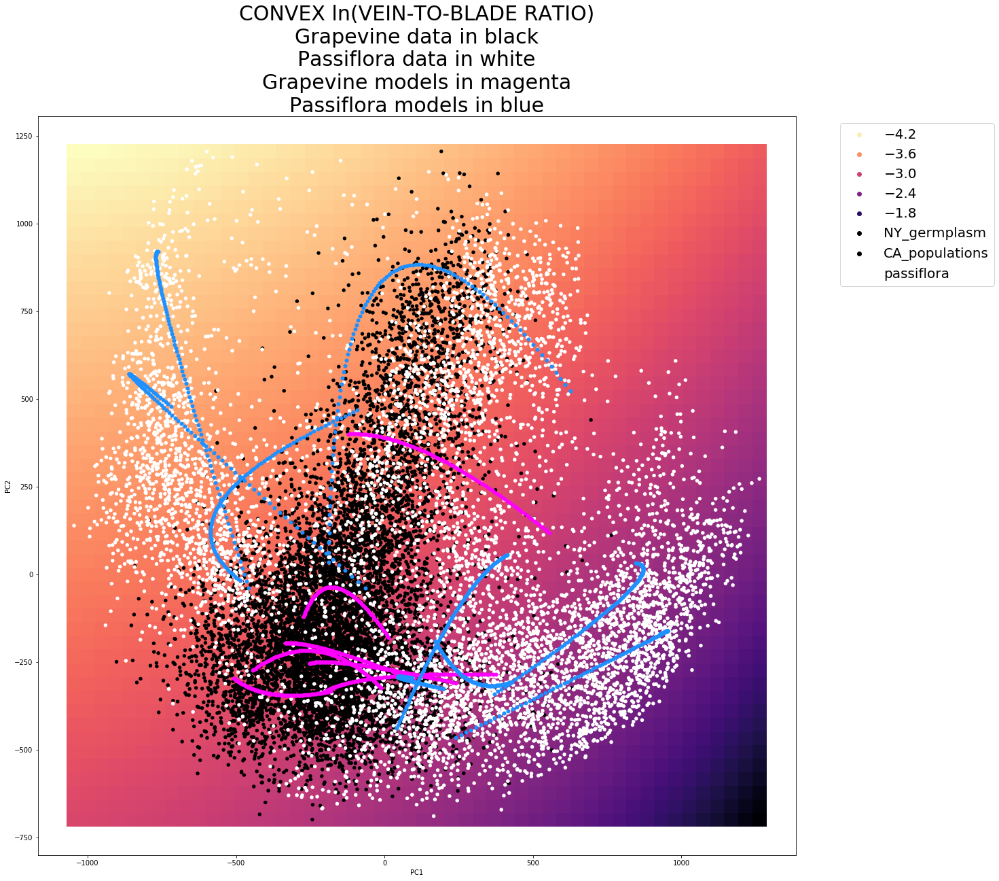

In [129]:
##################################################################
### VISUALIZE PCA OF EMPIRICAL DATA, CONVEX VEIN TO BLADE BACKGROUND
### WITH PROJECTED SPECIES DEVELOPMENTAL MODELS 
##################################################################

plt.figure(figsize=(20,20))

# visualize CONVEX ln(vein-to-blade) values
sns.scatterplot(data=inverse_df, x='PC1',y='PC2', color="k", hue="vein_to_blade", s=450, linewidth=0, alpha=1, palette="magma_r", cmap=True, marker="s")
# visualize empirical climate and lobing data points
sns.scatterplot(data=data_PCs_info, x='PC1',y='PC2', hue="dataset", s=30, linewidth=0, alpha=1, palette=["black","black","white"])
# visualize modeled species data for grapevine
sns.scatterplot(data=spe_model_PCs[spe_model_PCs["type"]=="g"], x='PC1',y='PC2',  color="magenta", linewidth=0, alpha=1)
# visualize modeled species data for passiflora
sns.scatterplot(data=spe_model_PCs[spe_model_PCs["type"]=="p"], x='PC1',y='PC2',  color="dodgerblue", linewidth=0, alpha=1)


plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', prop={'size': 20}) 

plt.title("CONVEX ln(VEIN-TO-BLADE RATIO)\nGrapevine data in black\nPassiflora data in white\nGrapevine models in magenta\nPassiflora models in blue", fontsize=30)

plt.savefig("./convex_vein_to_blade_PCA.jpg")



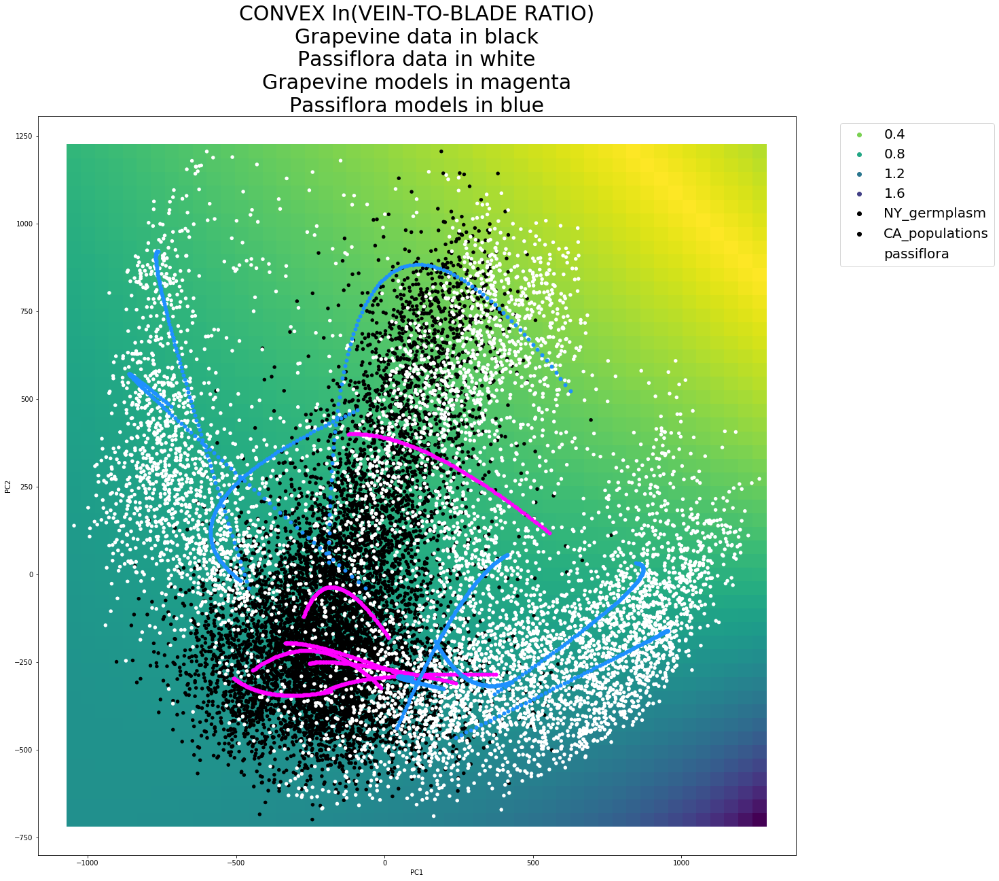

In [130]:
##################################################################
### VISUALIZE PCA OF EMPIRICAL DATA, CONVEX VEIN TO BLADE BACKGROUND
### WITH PROJECTED SPECIES DEVELOPMENTAL MODELS 
##################################################################

plt.figure(figsize=(20,20))

# visualize CONVEX ln(vein-to-blade) values
sns.scatterplot(data=inverse_df, x='PC1',y='PC2', color="k", hue="solidity", s=450, linewidth=0, alpha=1, palette="viridis_r", cmap=True, marker="s")
# visualize empirical climate and lobing data points
sns.scatterplot(data=data_PCs_info, x='PC1',y='PC2', hue="dataset", s=30, linewidth=0, alpha=1, palette=["black","black","white"])
# visualize modeled species data for grapevine
sns.scatterplot(data=spe_model_PCs[spe_model_PCs["type"]=="g"], x='PC1',y='PC2',  color="magenta", linewidth=0, alpha=1)
# visualize modeled species data for passiflora
sns.scatterplot(data=spe_model_PCs[spe_model_PCs["type"]=="p"], x='PC1',y='PC2',  color="dodgerblue", linewidth=0, alpha=1)


plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', prop={'size': 20}) 

plt.title("CONVEX ln(VEIN-TO-BLADE RATIO)\nGrapevine data in black\nPassiflora data in white\nGrapevine models in magenta\nPassiflora models in blue", fontsize=30)

plt.savefig("./solidity_PCA.jpg")


# EXTRA FUN VISUALIZING THE PCA SPACE !!!

(-546.7514108852439, 391.8445222711299, -2484.6310070123236, 933.5788151691229)

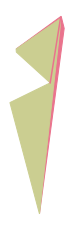

In [87]:
vein_col = "#EA738DFF" # bubblegum pink
blade_col = "#CBCE91FF" # pale green

inverse_PCA = pca.inverse_transform([1000,-1000,0,0])

xAval = inverse_PCA[0]
yAval = inverse_PCA[1]
xBval = inverse_PCA[2]
yBval = inverse_PCA[3]
xCval = inverse_PCA[4]
yCval = inverse_PCA[5]
xDval = inverse_PCA[6]
yDval = inverse_PCA[7]
xEval = inverse_PCA[8]
yEval = inverse_PCA[9]
xFval = inverse_PCA[10]
yFval = inverse_PCA[11]
xGval = inverse_PCA[12]
yGval = inverse_PCA[13]
xHval = inverse_PCA[14]
yHval = inverse_PCA[15]
xIval = inverse_PCA[16]
yIval = inverse_PCA[17]

vein_xvals = [xAval,xEval,xBval,xCval,xIval,xDval]
vein_yvals = [yAval,yEval,yBval,yCval,yIval,yDval]

blade_xvals = [xBval,xEval,xFval,xGval,xHval,xIval,xCval]
blade_yvals = [yBval,yEval,yFval,yGval,yHval,yIval,yCval]

plt.fill(vein_xvals,vein_yvals, c=vein_col)
plt.fill(blade_xvals,blade_yvals, c=blade_col)
plt.plot([xBval,xGval],[yBval,yGval], c=vein_col)
#plt.plot([xEval,xFval,xGval,xHval,xIval],[yEval,yFval,yGval,yHval,yIval], c=vein_col)

plt.gca().set_aspect("equal")
plt.axis("off")


In [16]:
PC1_vals = np.linspace(data_PCs_info["PC1"].min(), data_PCs_info["PC1"].max(), 10)
PC2_vals = np.linspace(data_PCs_info["PC2"].min(), data_PCs_info["PC2"].max(), 10)
PC3_vals = np.linspace(data_PCs_info["PC3"].min(), data_PCs_info["PC3"].max(), 20)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


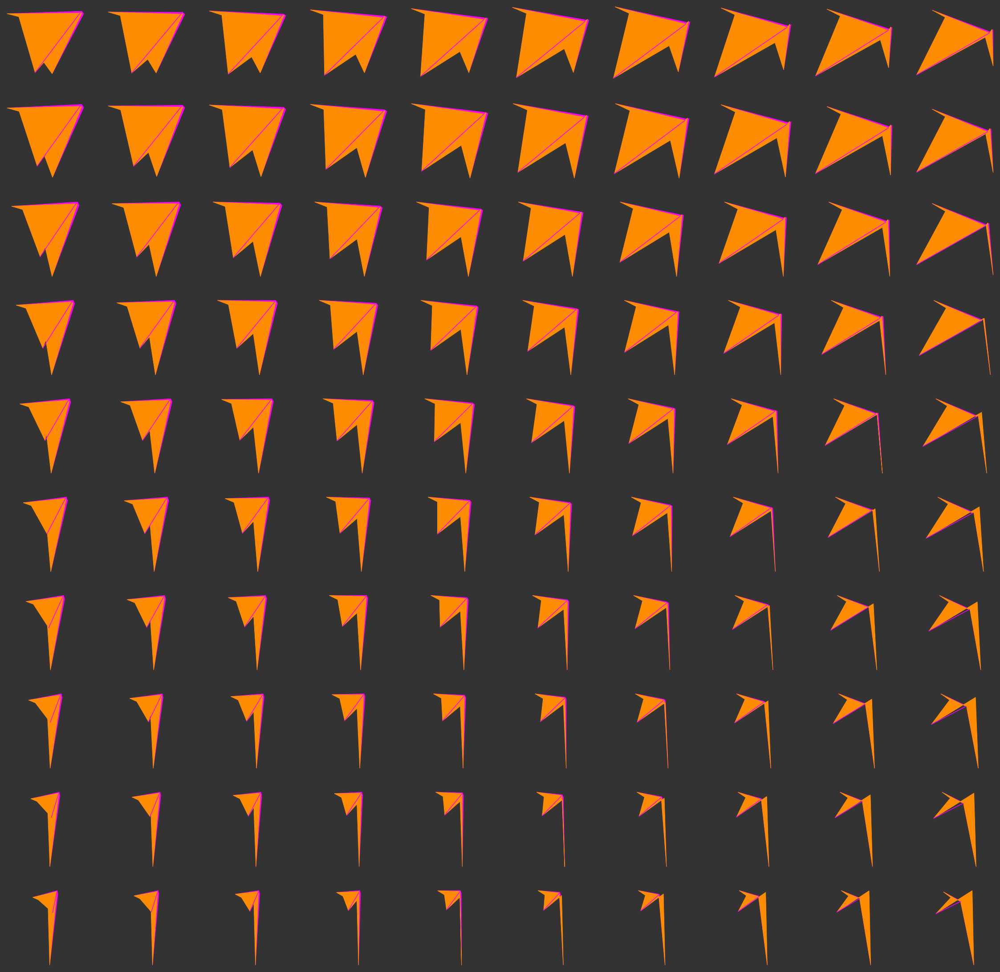

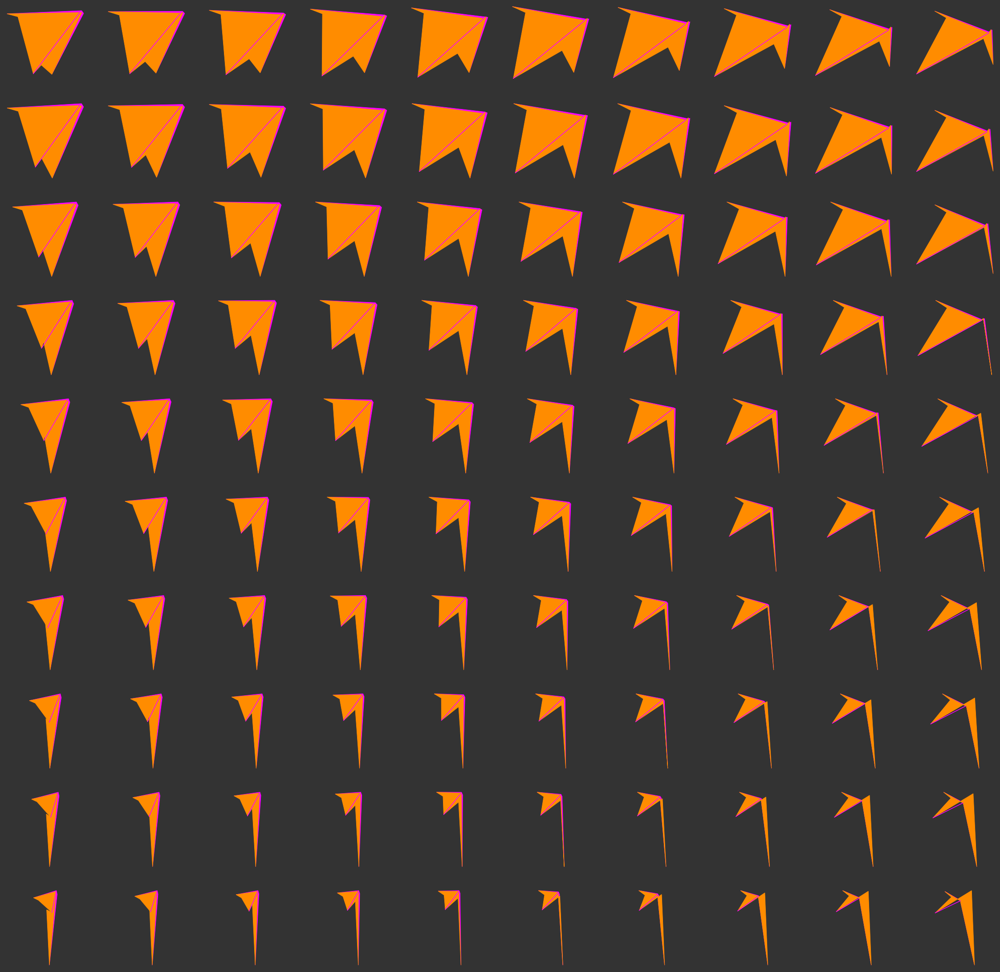

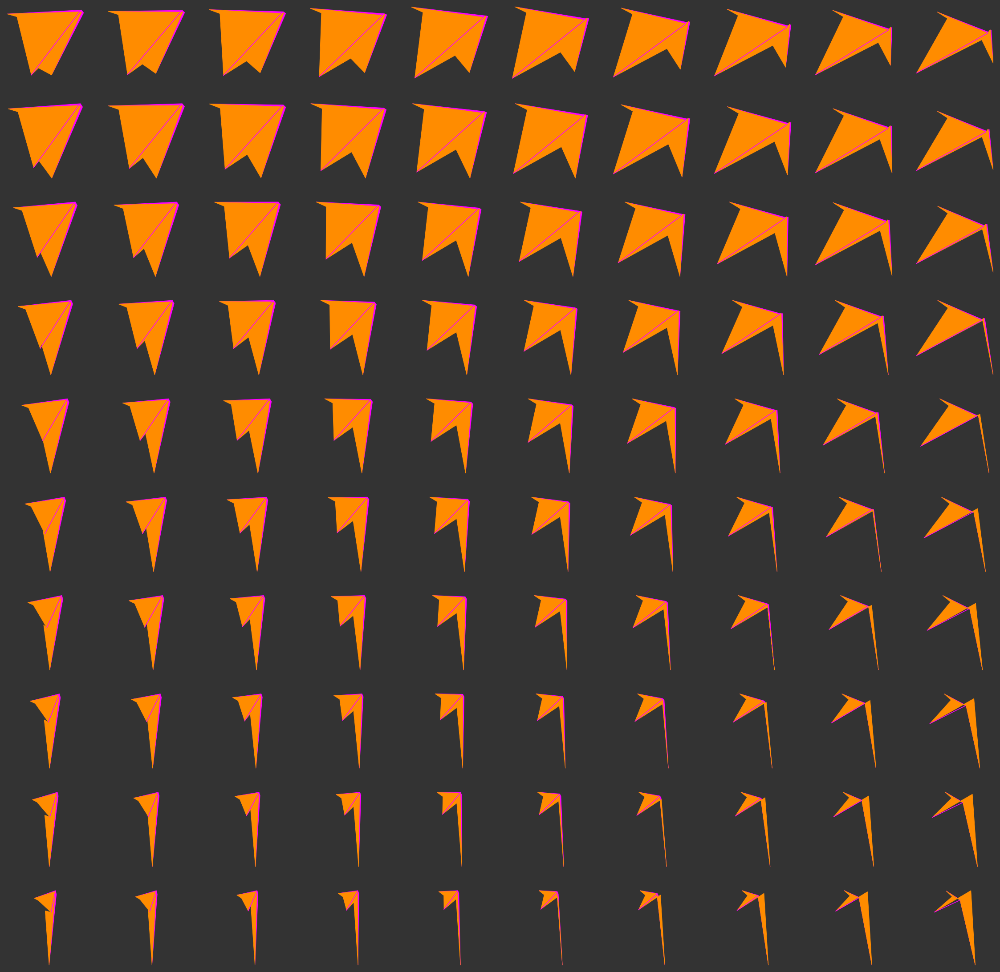

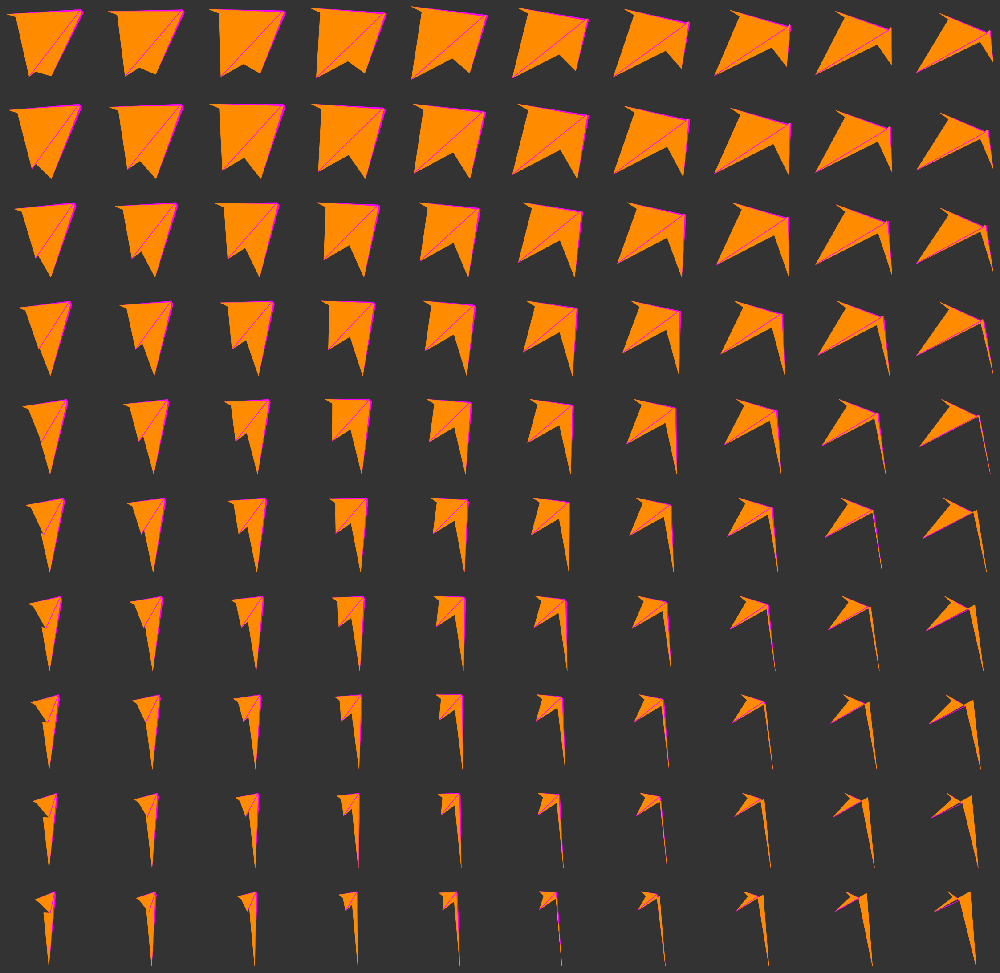

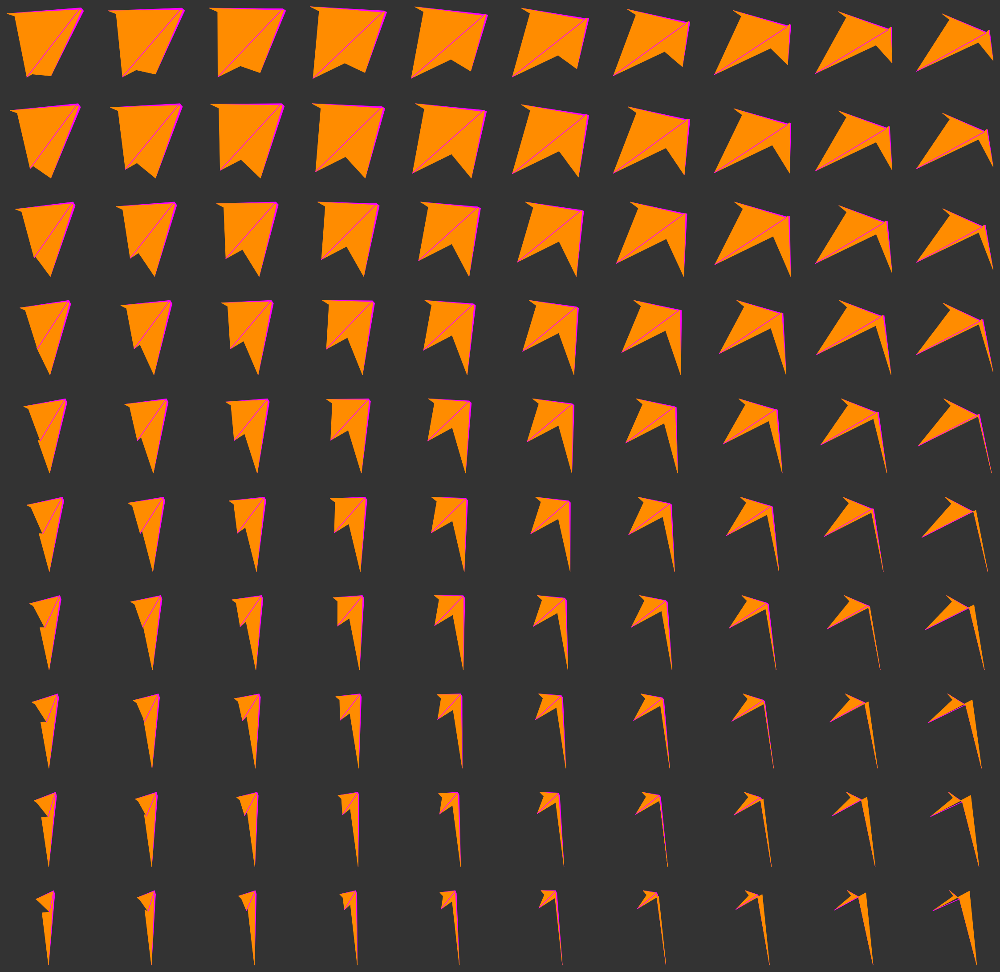

...

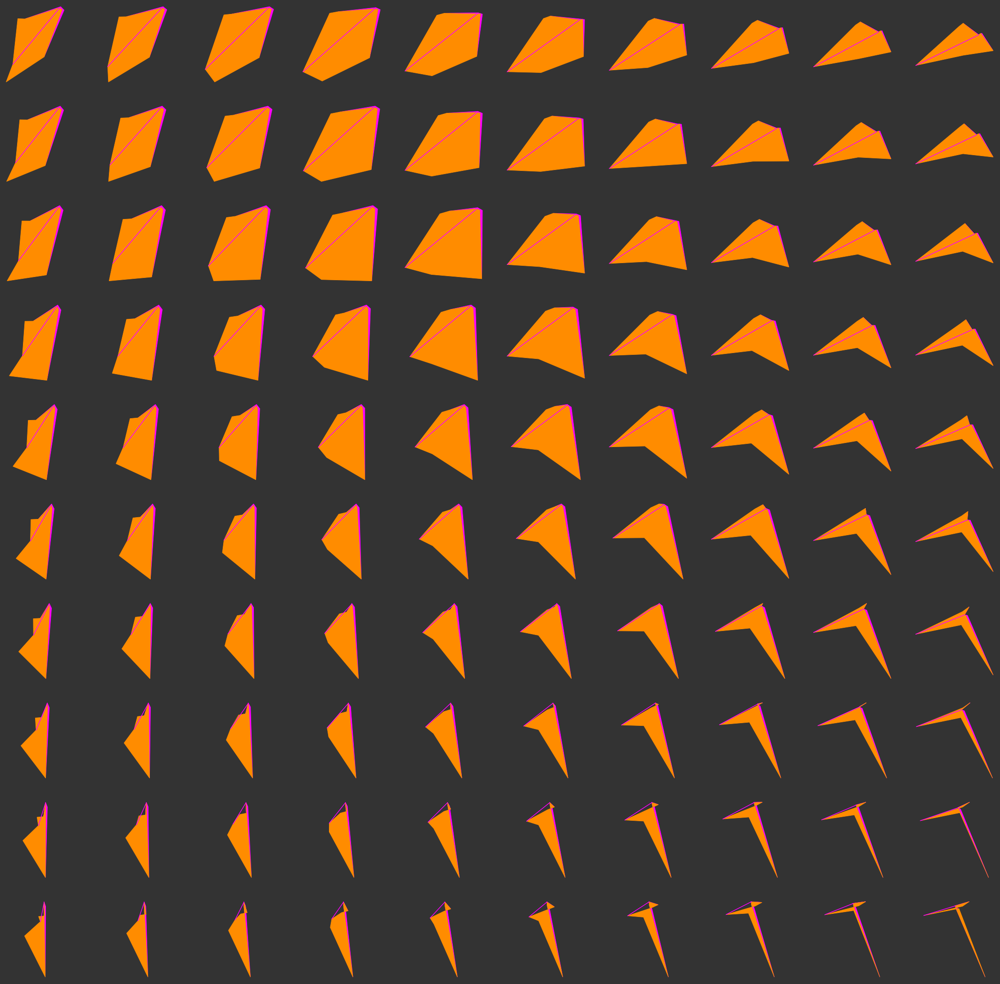

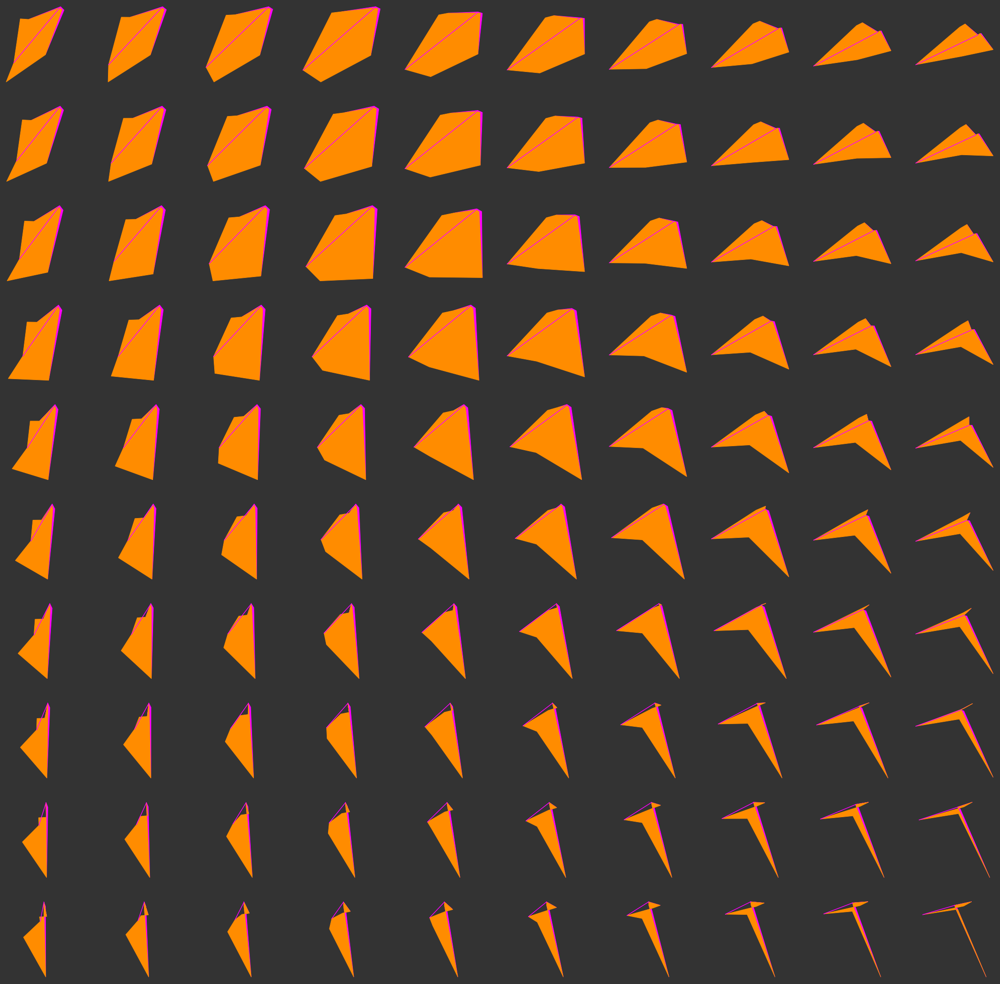

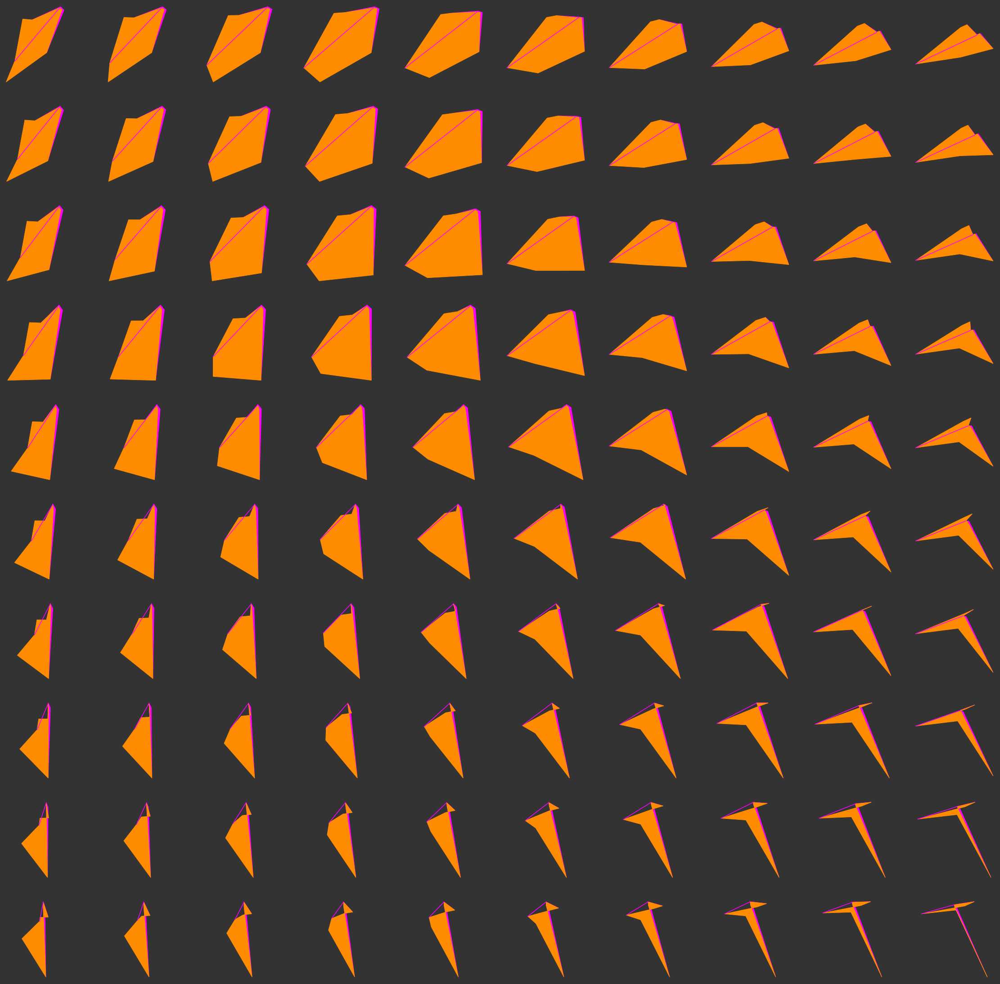

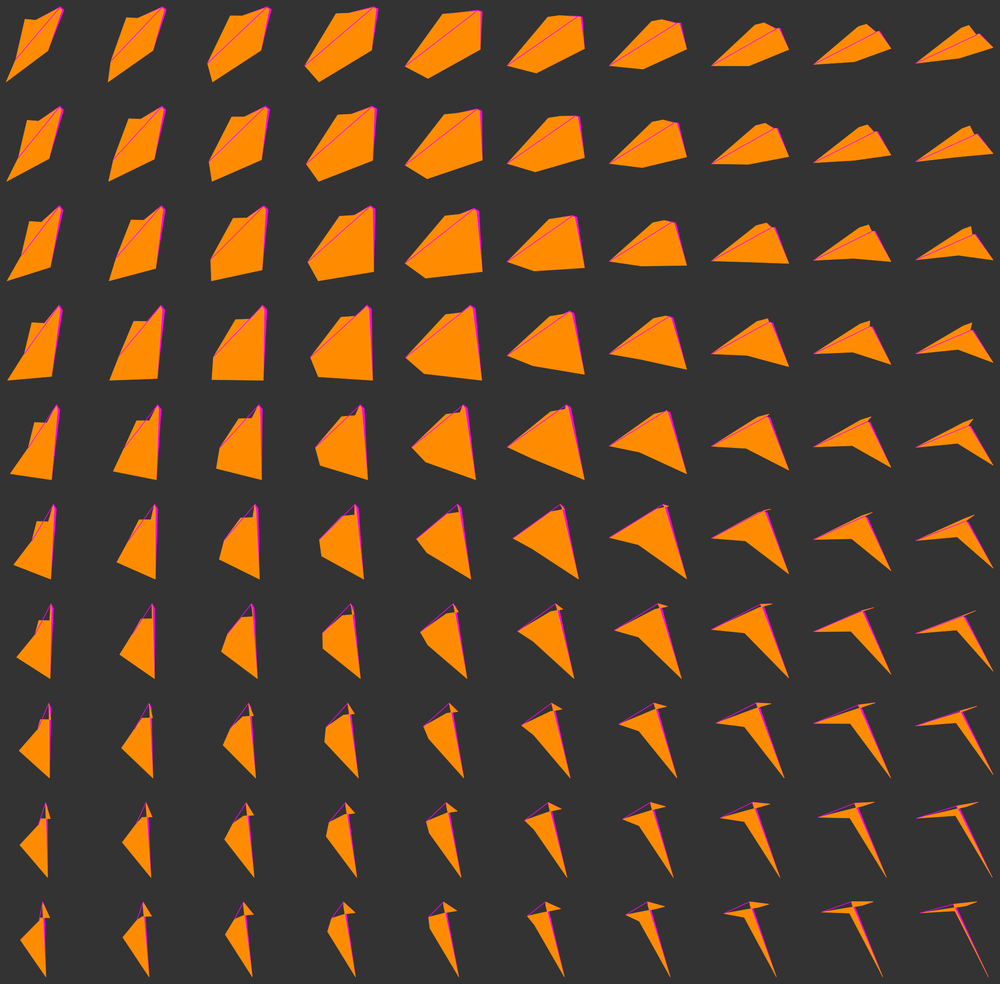

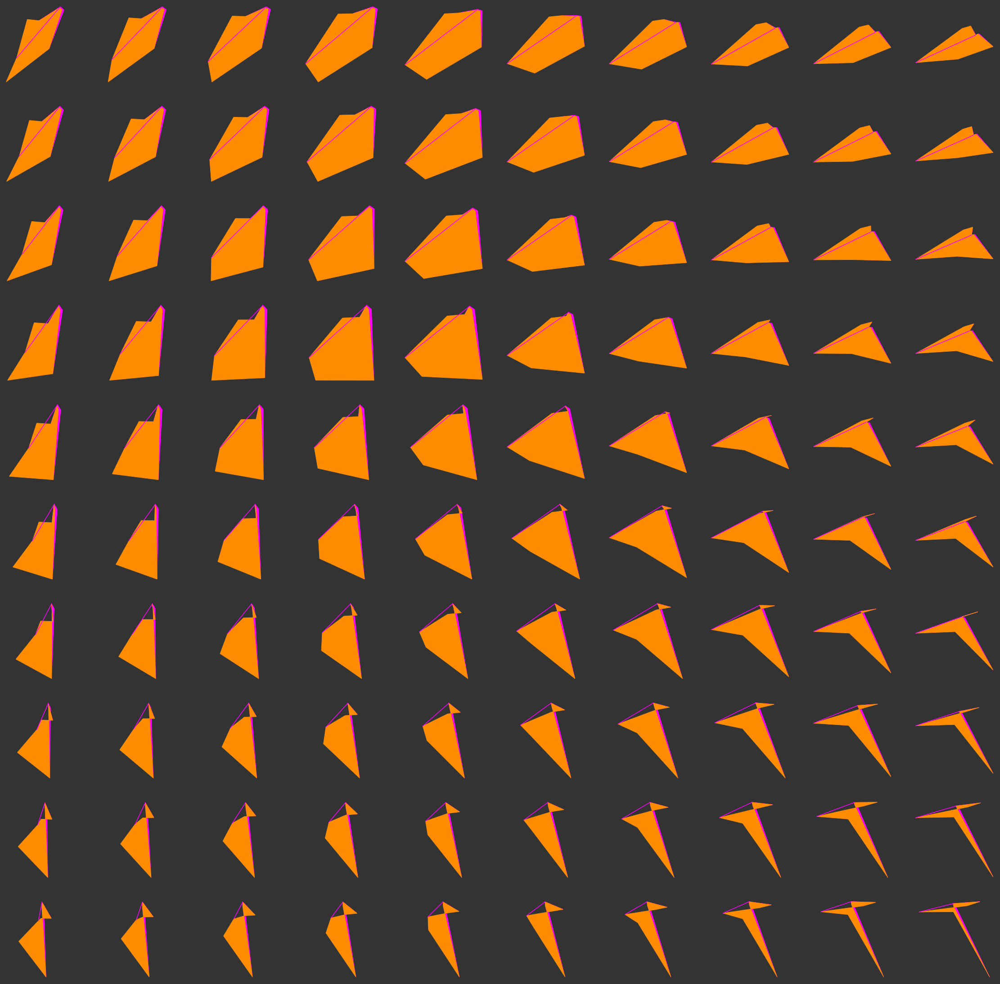

In [17]:
##################################################################
### VISUALIZE THEORETICAL LEAF SHAPES ACROSS PCA SPACE
### VEIN TO BLADE AND DISTAL LOBING ISOLINE
##################################################################

vein_col = "magenta" # bubblegum pink
blade_col = "darkorange" # pale green

for k in range(20):
    
    print(k)
    
    counter = 0
    fig = plt.figure(figsize=(40,40), facecolor="#333333")

    for i in range(10):

        for j in range(10):

            inverse_PCA = pca.inverse_transform([ PC1_vals[i], PC2_vals[j], PC3_vals[k], 0 ])

            xAval = inverse_PCA[0]
            yAval = inverse_PCA[1]
            xBval = inverse_PCA[2]
            yBval = inverse_PCA[3]
            xCval = inverse_PCA[4]
            yCval = inverse_PCA[5]
            xDval = inverse_PCA[6]
            yDval = inverse_PCA[7]
            xEval = inverse_PCA[8]
            yEval = inverse_PCA[9]
            xFval = inverse_PCA[10]
            yFval = inverse_PCA[11]
            xGval = inverse_PCA[12]
            yGval = inverse_PCA[13]
            xHval = inverse_PCA[14]
            yHval = inverse_PCA[15]
            xIval = inverse_PCA[16]
            yIval = inverse_PCA[17]

            counter += 1

            plt.subplot(10,10,counter)

            vein_xvals = [xAval,xEval,xBval,xCval,xIval,xDval]
            vein_yvals = [yAval,yEval,yBval,yCval,yIval,yDval]

            blade_xvals = [xBval,xEval,xFval,xGval,xHval,xIval,xCval]
            blade_yvals = [yBval,yEval,yFval,yGval,yHval,yIval,yCval]

            plt.fill(vein_xvals,vein_yvals, c=vein_col)
            plt.fill(blade_xvals,blade_yvals, c=blade_col)
            plt.plot([xBval,xGval],[yBval,yGval], c=vein_col)
            #plt.plot([xEval,xFval,xGval,xHval,xIval],[yEval,yFval,yGval,yHval,yIval], c=vein_col)

            plt.gca().set_aspect("equal")
            plt.axis("off")

    
    plt.savefig("./temp/temp_"+str(k)+".jpg", facecolor=fig.get_facecolor(), edgecolor='none')
    
plt.close()